In [23]:
import os
import sys
import pandas as pd
import numpy as np
import glob
import time
import gget
import scipy
from scipy.sparse import csr_matrix
import anndata as an
import scanpy as sc
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
import networkx as nx
import random
from importlib import reload
import warnings
import ot
from scipy.spatial.distance import pdist, squareform
from matplotlib.colors import ListedColormap
from matplotlib.cm import ScalarMappable
from collections import Counter
import matplotlib.patches as patches

import surprise as sup

from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import MinMaxScaler

"""WARNING: no warnings"""
warnings.filterwarnings("ignore")

# local imports
source_path = os.path.abspath("../utilities/")
sys.path.append(source_path)
import anndata_utils as anntools
import centrality as central
import matrix
import utils as ut
import plotting as plt2
import curvature as curv

In [10]:
resolution = 1000000
chrom = "chr7"

dpath = "/nfs/turbo/umms-indikar/shared/projects/poreC/pipeline_outputs/higher_order/by_chromosome/"

file_list = sorted(glob.glob(f"{dpath}*_{resolution}_{chrom}*"))
population_path = file_list[0]
print(population_path)

start_time = time.time()  # Record the start time
adata = sc.read_h5ad(population_path)
end_time = time.time()  # Record the end time
print(f"Time taken to read the file: {end_time - start_time:.2f} seconds")
sc.logging.print_memory_usage()

# sort the object by global bin id
sorted_indices = adata.obs['bin'].argsort()
adata = adata[sorted_indices, :] 

adata

/nfs/turbo/umms-indikar/shared/projects/poreC/pipeline_outputs/higher_order/by_chromosome/population_mESC_1000000_chr7.h5ad
Time taken to read the file: 2.70 seconds
Memory usage: current 0.63 GB, difference +0.09 GB


View of AnnData object with n_obs × n_vars = 142 × 85534
    obs: 'bin_index', 'bin_start', 'bin_end', 'bin', 'chrom', 'chrom_bin', 'degree', 'genes', 'n_genes', 'ATACSeq_1', 'ATACSeq_2', 'ATACSeq_3', 'CTCF', 'H3K27ac', 'H3K27me3', 'RNA_1', 'RNA_2', 'RNA_3', 'RNA_4', 'RNA_5', 'RNA_6', 'PolII', 'chrom_degree'
    var: 'read_index', 'basename', 'mean_mapq', 'median_mapq', 'n_chromosomes', 'order', 'n_bins', 'read_length_bp', 'genes', 'n_genes', 'chrom_order'
    uns: 'base_resolution', 'chrom_sizes', 'gene_map'

# Merge in scores

In [12]:
fpath = f"/nfs/turbo/umms-indikar/shared/projects/poreC/pipeline_outputs/higher_order/core_scores/population_mESC_{resolution}_{chrom}.csv"
df = pd.read_csv(fpath)
print(f"{df.shape=}")

# drop outliers 
df = df.sort_values(by='bin')
columns_to_drop = [x for x in df.columns if x in adata.obs.columns]
df = df.drop(columns=columns_to_drop)
print(f"{df.shape=}")


adata.obs = pd.merge(
    adata.obs, df.set_index('bin_name'),
    how='left',
    left_index=True,
    right_index=True,
)

adata.obs.head()

df.shape=(137, 33)
df.shape=(137, 11)


,bin_index,bin_start,bin_end,bin,chrom,chrom_bin,degree,genes,n_genes,ATACSeq_1,...,degree_outlier,ce_singular_vector_1,ce_eigenvector_centrality,ce_betweenness_centrality,ce_pagerank,hge_singular_vector_1,hge_logexp_unweighted,hge_logexp_degree_weighted,hge_logexp_RNA_weighted,hge_logexp_ATAC_weighted
bin_name,,,,,,,,,,,,,,,,,,,,,
chr7:3,2004,3000000,4000000,1000,7,3,3192,Gm44920;Cacng8;Tarm1;Gm44459;2700052C19Rik;330...,56,0.580264,...,False,0.235631,0.235630,0.098859,0.232369,0.000000,0.967985,0.012140,0.630349,0.734800
chr7:4,126,4000000,5000000,1001,7,4,3449,Shisa7;Zfp579;Nat14;Gm5319;Lilra5;Leng9;Isoc2b...,61,0.718971,...,False,0.283737,0.283736,0.034221,0.284262,0.035761,0.962838,0.087377,0.567622,0.834639
chr7:5,1293,5000000,6000000,1002,7,5,2987,Zfp524;Gm44821;Zfp865;Gm44820;Vmn1r55;U2af2;Lg...,37,0.407093,...,False,0.299868,0.299868,0.080323,0.306115,0.082684,0.946606,0.127173,0.609611,0.565472
chr7:6,1868,6000000,7000000,1003,7,6,3722,Gm44584;Or6z5;Gm44586;Gm20715;Usp29;Zfp583;Gm3...,44,0.721205,...,False,0.546624,0.546623,0.002852,0.554230,0.179786,0.975546,0.351601,0.229861,0.838165
chr7:7,1363,7000000,8000000,1004,7,7,4389,Zfp773;Gm18200;Gm3563;Vmn2r31;Gm18190;Gm7648;G...,37,0.215361,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
def find_outliers_iqr(df_column):
  """
  Identifies outliers in a pandas DataFrame column using the IQR method.

  Args:
    df_column: A pandas Series representing the column to analyze.

  Returns:
    A boolean mask with True for outliers and False otherwise.
  """
  Q1 = df_column.quantile(0.15)
  Q3 = df_column.quantile(0.85)
  IQR = Q3 - Q1
  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR
  return (df_column < lower_bound) | (df_column > upper_bound)

adata.obs['degree_outlier'] = find_outliers_iqr(adata.obs['chrom_degree'])

# remove outliers
remove_bins = adata.obs[adata.obs['degree_outlier']].index.to_list()
print(f"Removing top {len(remove_bins)} outlier loci: ")
print(remove_bins)
adata = adata[~adata.obs_names.isin(remove_bins), :].copy()

print('done!')

Removing top 5 outlier loci: 
['chr7:7', 'chr7:8', 'chr7:20', 'chr7:21', 'chr7:22']
done!


In [14]:
# Clique_expand
matrix.expand_and_normalize_anndata(adata, oe_kr=False)
adata

Expanding input matrix...
Applying KR normalization...
Applying OE normalization...
Normalization complete.


AnnData object with n_obs × n_vars = 137 × 85534
    obs: 'bin_index', 'bin_start', 'bin_end', 'bin', 'chrom', 'chrom_bin', 'degree', 'genes', 'n_genes', 'ATACSeq_1', 'ATACSeq_2', 'ATACSeq_3', 'CTCF', 'H3K27ac', 'H3K27me3', 'RNA_1', 'RNA_2', 'RNA_3', 'RNA_4', 'RNA_5', 'RNA_6', 'PolII', 'chrom_degree', 'degree_outlier', 'ce_singular_vector_1', 'ce_eigenvector_centrality', 'ce_betweenness_centrality', 'ce_pagerank', 'hge_singular_vector_1', 'hge_logexp_unweighted', 'hge_logexp_degree_weighted', 'hge_logexp_RNA_weighted', 'hge_logexp_ATAC_weighted'
    var: 'read_index', 'basename', 'mean_mapq', 'median_mapq', 'n_chromosomes', 'order', 'n_bins', 'read_length_bp', 'genes', 'n_genes', 'chrom_order'
    uns: 'base_resolution', 'chrom_sizes', 'gene_map'
    obsm: 'A', 'A_kr', 'A_oe'

In [15]:
adata.obs.columns

Index(['bin_index', 'bin_start', 'bin_end', 'bin', 'chrom', 'chrom_bin',
       'degree', 'genes', 'n_genes', 'ATACSeq_1', 'ATACSeq_2', 'ATACSeq_3',
       'CTCF', 'H3K27ac', 'H3K27me3', 'RNA_1', 'RNA_2', 'RNA_3', 'RNA_4',
       'RNA_5', 'RNA_6', 'PolII', 'chrom_degree', 'degree_outlier',
       'ce_singular_vector_1', 'ce_eigenvector_centrality',
       'ce_betweenness_centrality', 'ce_pagerank', 'hge_singular_vector_1',
       'hge_logexp_unweighted', 'hge_logexp_degree_weighted',
       'hge_logexp_RNA_weighted', 'hge_logexp_ATAC_weighted'],
      dtype='object')

n core nodes: 34
node_size=(119.1304347826087,)
Graph with 137 nodes and 2347 edges


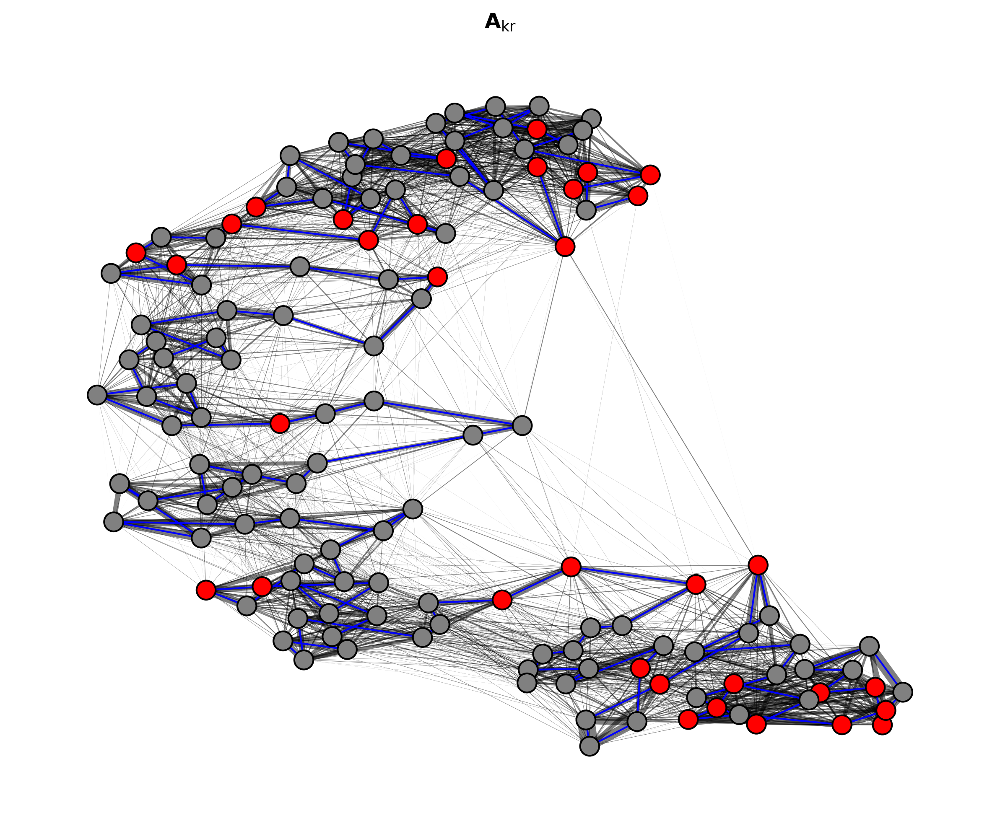

In [18]:
obsm_key = 'A_kr'
core_score = 'hge_logexp_RNA_weighted'
edge_threshold_quantile = 0.75
core_threshold_quantile = 0.75
order_threshold = 2

# plotting params
node_scale = 1.15
node_edgewidth = 1.0
edge_scale = 10
edge_alpha = 0.5
draw_linear = True

vector = adata.obs[core_score].values
threshold = np.quantile(vector, core_threshold_quantile)
core_nodes = adata.obs[adata.obs[core_score] > threshold].index.to_list()
print(f"n core nodes: {len(core_nodes)}")

node_attributes = adata.obs.copy()
node_attributes['core'] = node_attributes.index.isin(core_nodes)
node_attributes = node_attributes.to_dict(orient='index')

node_size = len(node_attributes) / node_scale,
print(f"{node_size=}")

# define the graph
A = adata.obsm[obsm_key].copy()
A = A.mask(np.eye(A.shape[0], dtype=bool), 0)
threshold = np.quantile(A, edge_threshold_quantile)
A[A < threshold] = 0
G = nx.from_pandas_adjacency(A)
nx.set_node_attributes(G, node_attributes)

# get consecutive edges
nodes = adata.obs.index.to_list()
ordered_nodes = list(zip(nodes, nodes[1:]))

G.pos = nx.spring_layout(G, seed=32)
print(G)

node_colors = ['red' if G.nodes[node]['core'] else 'grey' for node in G.nodes]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 8

nx.draw_networkx_nodes(
    G, 
    G.pos,
    node_size=node_size,
    node_color=node_colors,
    edgecolors='black', 
    linewidths=node_edgewidth,      
)

edge_widths = np.asarray([(d['weight']) for u, v, d in G.edges(data=True)])
edge_widths = ut.min_max(edge_widths) * edge_scale

nx.draw_networkx_edges(
    G, 
    G.pos,
    width=edge_widths,
    edge_color='k',
    alpha=edge_alpha,
)

if draw_linear:
    nx.draw_networkx_edges(
        G, 
        G.pos,
        edgelist=ordered_nodes,
        width=1,
        edge_color='blue',
    )

plt.title(r"$\mathbf{A}_{\mathrm{kr}}$")
sns.despine(left=True, bottom=True)

# Identify most common hyperedges

H.shape=(34, 16)
16 hyperedges of order 5
average count counts['count'].mean()=1.0
                   hyperedge  count  is_consecutive        std
0    (30, 34, 126, 127, 140)      1           False  48.767202
1  (127, 140, 141, 142, 144)      1           False   6.046487
2    (4, 109, 126, 142, 144)      1           False  52.053818
3     (34, 45, 46, 108, 114)      1           False  34.278856
4     (12, 13, 59, 126, 140)      1           False  54.350713


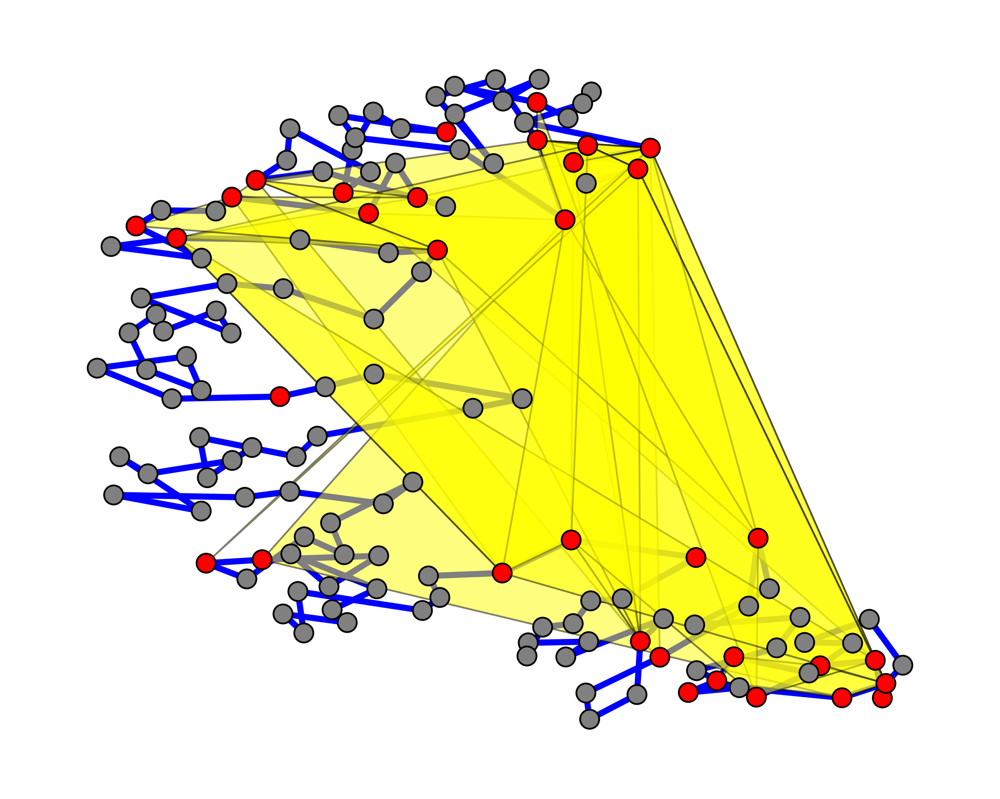

In [19]:
plot_n = 35
color = 'yellow'
order = 5
std_threshold = 1 # higher is longer range
remove_consecutive = False

def is_consecutive(tup):
  if len(tup) < 2:
    return True  # A tuple with 0 or 1 elements is considered consecutive

  for i in range(1, len(tup)):
    if tup[i] - tup[i - 1] != 1:
      return False
  return True

# get the hyperedges
H = adata[adata.obs.index.isin(core_nodes) > threshold].to_df()
H = H.loc[:, H.sum() == order]
print(f"{H.shape=}")

hyperedges = []
for col in H.columns:
    bins_present = set(H.index[H[col] == 1])
    bins_present = [int(x.split(":")[1]) for x in bins_present]
    hyperedges.append(sorted(bins_present))

# count them
counts = Counter(tuple(edge) for edge in hyperedges) 

counts = pd.DataFrame.from_dict(
    counts, 
    orient='index',
).reset_index()

counts.columns = ['hyperedge', 'count'] 
counts = counts.sort_values(by='count', ascending=False)
counts['is_consecutive'] = counts['hyperedge'].apply(lambda x : is_consecutive(x))
counts['std'] = counts['hyperedge'].apply(lambda x : np.std(x))

# remove consecutive and boring hyperedges
if remove_consecutive:
    counts = counts[~counts['is_consecutive']]
    
counts = counts[counts['std'] > std_threshold]
print(f"{len(counts)} hyperedges of order {order}")
print(f"average count {counts['count'].mean()=}")
print(counts.head())

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 10, 8

nx.draw_networkx_nodes(
    G, 
    G.pos,
    node_size=node_size,
    node_color=node_colors,
    edgecolors='black', 
    linewidths=node_edgewidth,      
)

edge_widths = np.asarray([(d['weight']) for u, v, d in G.edges(data=True)])
edge_widths = ut.min_max(edge_widths) * edge_scale

if draw_linear:
    nx.draw_networkx_edges(
        G, 
        G.pos,
        edgelist=ordered_nodes,
        width=3.5,
        edge_color='blue',
)

# Plot filled polygons
ax = plt.gca()
for polygon_nodes in counts['hyperedge'].head(plot_n):
    polygon_coords = [G.pos[f"{chrom}:{node}"] for node in polygon_nodes]
    poly = patches.Polygon(
        polygon_coords, 
        closed=True, 
        alpha=0.5, 
        facecolor=color,
        edgecolor='k',
)  
    ax.add_patch(poly)

sns.despine(left=True, bottom=True)

In [10]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

# OE Normed

In [ ]:
# obsm_key = 'A_oe'
# core_score = 'hge_logexp_RNA_weighted'
# edge_threshold_quantile = 0.85
# core_threshold_quantile = 0.75
# order_threshold = 2

# vector = adata.obs[core_score].values
# threshold = np.quantile(vector, core_threshold_quantile)
# core_nodes = adata.obs[adata.obs[core_score] > threshold].index.to_list()

# node_attributes = adata.obs.copy()
# node_attributes['core'] = node_attributes.index.isin(core_nodes)
# node_attributes = node_attributes.to_dict(orient='index')

# # define the graph
# A = adata.obsm[obsm_key].copy()
# A = A.mask(np.eye(A.shape[0], dtype=bool), 0)
# threshold = np.quantile(A, edge_threshold_quantile)
# A[A < threshold] = 0
# G = nx.from_pandas_adjacency(A)
# nx.set_node_attributes(G, node_attributes)

# G.pos = nx.spring_layout(G)
# print(G)

# node_colors = ['red' if G.nodes[node]['core'] else 'grey' for node in G.nodes]

# plt.rcParams['figure.dpi'] = 300
# plt.rcParams['figure.figsize'] = 8, 8

# nx.draw_networkx_nodes(
#     G, 
#     G.pos,
#     node_size=45,
#     node_color=node_colors,
#     edgecolors='black', 
#     linewidths=0.5,      
# )

# nx.draw_networkx_edges(
#     G, 
#     G.pos,
#     width=[(d['weight']*0.1) for u, v, d in G.edges(data=True)],
#     edge_color='k',
#     alpha=0.3,
# )

# nx.draw_networkx_edges(
#     G, 
#     G.pos,
#     edgelist=ordered_nodes,
#     width=1,
#     edge_color='blue',
# )

# plt.title(r"$\mathbf{A}_{\text{oe}}$")
# sns.despine(left=True, bottom=True)

# Plot Features

In [ ]:
adata.obs.columns

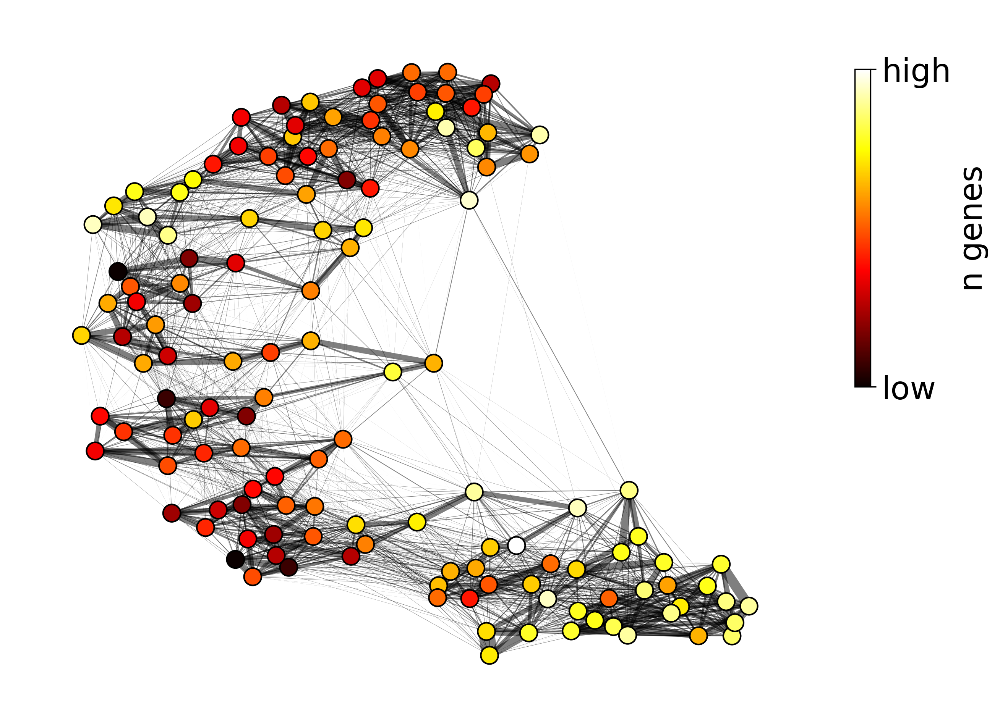

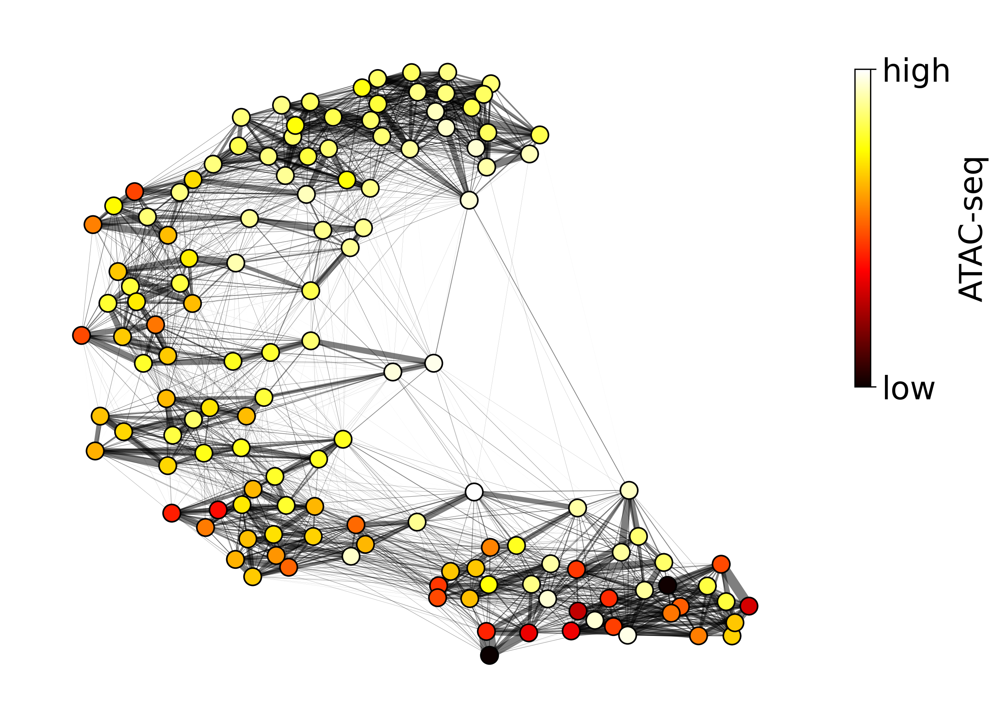

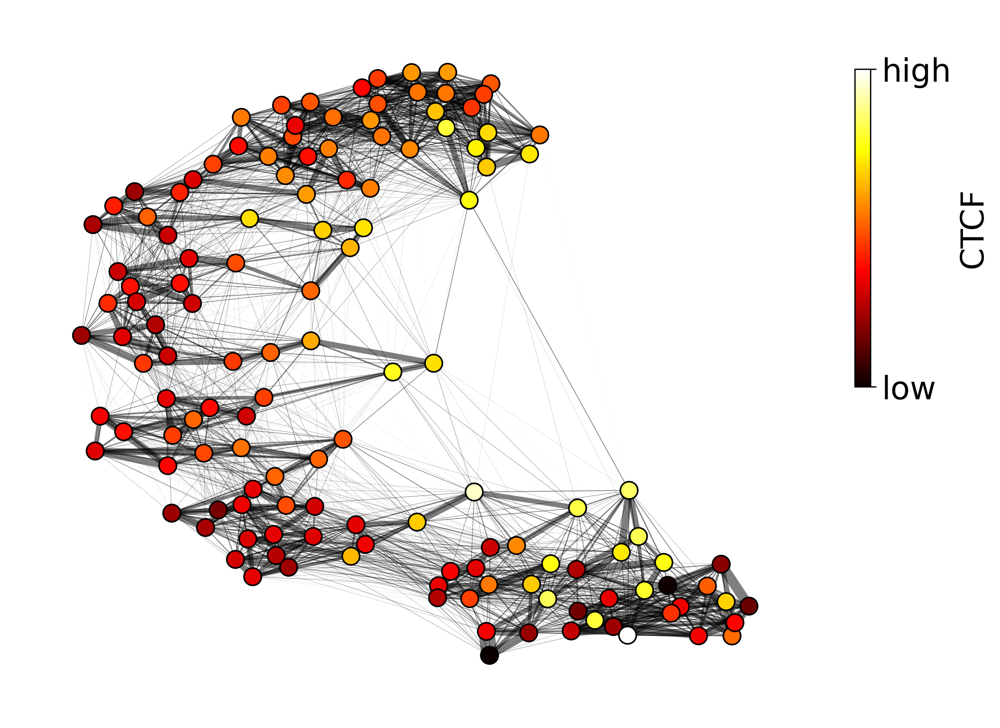

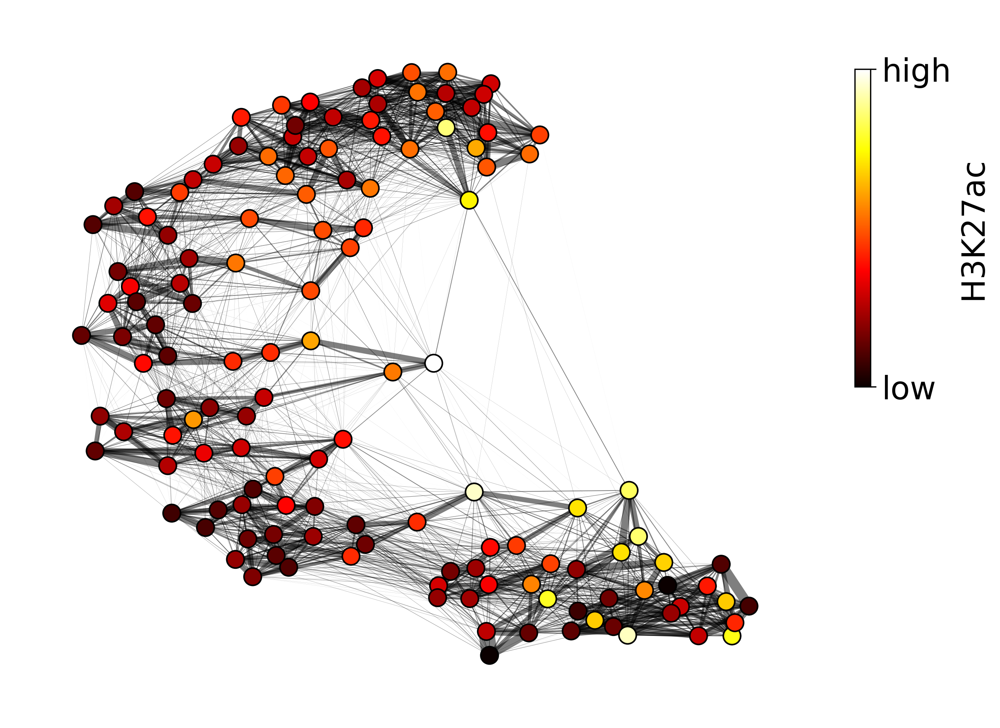

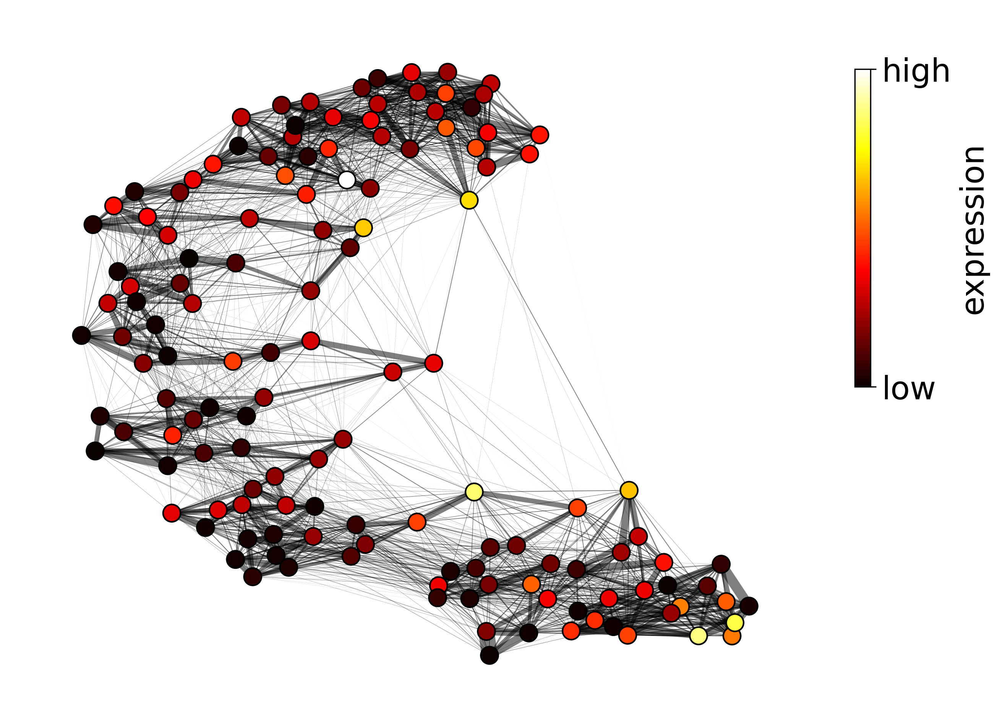

In [20]:
# # plotting params
# node_scale = 4
# node_edgewidth = 0.5
# edge_scale = 5
# edge_alpha = 0.5
draw_linear = False
fontsize = 20

plot_columns = {
    # 'chrom_degree' : 'hot',
    'n_genes' : 'hot',
    'ATACSeq_1' : 'hot',
    'CTCF' : 'hot',
    'H3K27ac' : 'hot',
    'RNA_5' : 'hot',
    # 'ce_eigenvector_centrality' : 'inferno',
    # 'hge_singular_vector_1' : 'inferno',
    # 'hge_logexp_unweighted' : 'inferno',
    # 'hge_logexp_RNA_weighted' : 'inferno',
}

labels = [
    'n genes',
    'ATAC-seq',
    'CTCF',
    'H3K27ac',
    'expression',
]


for i, (color_by, cmap) in enumerate(plot_columns.items()):

    node_colors = [np.log1p(G.nodes[node][color_by]) for node in G.nodes]

    edge_widths = np.asarray([(d['weight']) for u, v, d in G.edges(data=True)])
    edge_widths = ut.min_max(edge_widths) * edge_scale

    plt.rcParams['figure.dpi'] = 300
    plt.rcParams['figure.figsize'] = 10, 8
    
    nx.draw_networkx_nodes(
        G, 
        G.pos,
        node_size=len(node_attributes) / node_scale,
        node_color=node_colors,
        edgecolors='black', 
        linewidths=node_edgewidth,   
        cmap=cmap,
    )
    
    nx.draw_networkx_edges(
        G, 
        G.pos,
        width=edge_widths,
        edge_color='k',
        alpha=edge_alpha,
    )

    if draw_linear:
        nx.draw_networkx_edges(
            G, 
            G.pos,
            edgelist=ordered_nodes,
            width=1,
            edge_color='blue',
        )

    sns.despine(left=True, bottom=True)
    # plt.title(f"{chrom}:{color_by}")

    ax = plt.gca()
    divider = make_axes_locatable(ax)
    ax_cbar = divider.append_axes(
        "right", 
        size="10%",
        pad=0.001,
    ) 

    ticks = [min(node_colors), max(node_colors)]
    cbar = plt.colorbar(
        ScalarMappable(
            cmap=cmap, 
            norm=plt.Normalize(vmin=min(node_colors), vmax=max(node_colors))),
        orientation='vertical',
        ax=ax_cbar,
        ticks=ticks,
        label=labels[i],
        shrink=0.45,
        anchor=(0.75, 0.85),
    )

    cbar.ax.set_yticklabels(['low', 'high'])
    cbar.ax.tick_params(labelsize=fontsize)  
    cbar.set_label(labels[i], fontsize=fontsize)
    ax_cbar.set_visible(False) 
    plt.show()
    # break
    

In [ ]:
?plt.colorbar

In [53]:
vh_df = pd.DataFrame(
    adata.X.toarray(),  # Convert sparse matrix to dense numpy array
    index=adata.obs_names,    # Node names (bins)
    columns=adata.var_names   # Hyperedge names (reads)
)

# 2. (Optional) Define weights from your existing data
# Use any node-level metric for vertex weights
v_weights = adata.obs['hge_logexp_RNA_weighted'] 

# Use any edge-level metric for hyperedge weights
e_weights = adata.var['order'] # 'order' or 'n_bins' seem like good candidates

# 3. Run the calculation
# Pass the VH DataFrame and optional weights. 
# We skip EF (faces) for this example.
forman_scores = curv.compute_forman_curvature(VH=vh_df)

# 4. Store the result in adata.var
# The output is a pd.Series indexed by var_names, so you can assign it directly
adata.var['forman_curvature'] = forman_scores

# You can now see 'forman_curvature' in your .var columns
print(adata.var.head())

                                      read_index basename  mean_mapq  \
read_name                                                              
9052b9ea-478f-4351-bc31-6a0a3f9becb5          30  batch04  53.368421   
a7d58484-4b6f-4498-960b-71d8229b3d94          96  batch04  53.500000   
d069851e-2ad6-4ac4-9df1-6a09921b3b7e         144  batch04  40.666667   
ca19a9ca-93bd-4c37-863e-7ec6768a12aa         201  batch03  48.814815   
7bd11f1d-e455-43ff-8f2a-885d6caa5783         205  batch01  60.000000   

                                      median_mapq  n_chromosomes  order  \
read_name                                                                 
9052b9ea-478f-4351-bc31-6a0a3f9becb5         60.0              3     19   
a7d58484-4b6f-4498-960b-71d8229b3d94         60.0              3      4   
d069851e-2ad6-4ac4-9df1-6a09921b3b7e         60.0              4      9   
ca19a9ca-93bd-4c37-863e-7ec6768a12aa         60.0              8     27   
7bd11f1d-e455-43ff-8f2a-885d6caa5783         

In [54]:
VHb = (adata.X > 0).astype(int)
edge_curvatures = adata.var['forman_curvature'].fillna(0)

# Calculate the sum of curvatures for edges connected to each node
sum_curv_per_node = VHb.dot(edge_curvatures.values)

# Calculate the degree of each node
node_degrees = VHb.sum(axis=1).A1

# Compute the mean, avoiding division by zero
mean_curv_per_node = np.zeros_like(node_degrees, dtype=float)
non_zero_mask = (node_degrees > 0)
mean_curv_per_node[non_zero_mask] = sum_curv_per_node[non_zero_mask] / node_degrees[non_zero_mask]

# Store this new NODE-LEVEL metric in adata.obs
adata.obs['mean_forman_curvature'] = mean_curv_per_node
adata.obs['sum_forman_curvature'] = sum_curv_per_node

print("Successfully calculated and stored 'mean_forman_curvature' in adata.obs.")

Successfully calculated and stored 'mean_forman_curvature' in adata.obs.


Graph with 137 nodes and 2347 edges


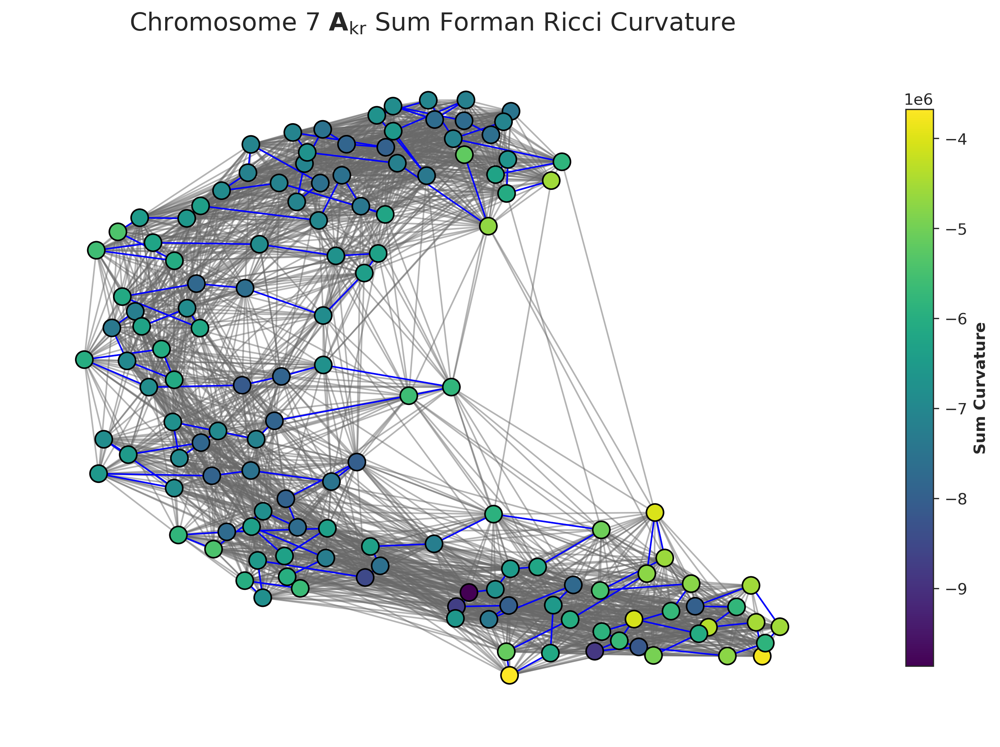

In [60]:
import matplotlib.cm as cm
sns.set_style("white")
obsm_key = 'A_kr'
node_scale = 1.15
node_edgewidth = 1.0
edge_scale = 10
edge_alpha = 0.5
draw_linear = True

# --- REMOVED core node calculation ---

# Copy all node attributes from adata.obs (this now includes 'mean_forman_curvature')
node_attributes = adata.obs.to_dict(orient='index')

# define the graph
A = adata.obsm[obsm_key].copy()
A = A.mask(np.eye(A.shape[0], dtype=bool), 0)
# We keep the edge thresholding to make the graph interpretable
edge_threshold_quantile = 0.75
threshold = np.quantile(A, edge_threshold_quantile)
A[A < threshold] = 0
G = nx.from_pandas_adjacency(A)
nx.set_node_attributes(G, node_attributes)

# get consecutive edges
nodes = adata.obs.index.to_list()
ordered_nodes = list(zip(nodes, nodes[1:]))

G.pos = nx.spring_layout(G, seed=32)
print(G)

# --- ADDED: Get node curvatures and create a colormap ---
# Get the curvature value for each node from the graph attributes
curvatures = [G.nodes[node]['sum_forman_curvature'] for node in G.nodes()]

# Set up the colormap and normalization
cmap = plt.get_cmap('viridis')
norm = plt.Normalize(vmin=min(curvatures), vmax=max(curvatures))
node_colors = [cmap(norm(c)) for c in curvatures]

# --- PLOTTING ---
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 12, 8 # Increased width for colorbar

nx.draw_networkx_nodes(
    G, 
    G.pos,
    node_size=len(node_attributes) / node_scale,
    node_color=node_colors, # MODIFIED: Use the new 'node_colors' list
    edgecolors='black', 
    linewidths=node_edgewidth,       
)

# This part for drawing edges remains the same
edge_widths = np.asarray([(d['weight']) for u, v, d in G.edges(data=True)])
# edge_widths = min_max_scaler(edge_widths) * edge_scale # Assuming you have this scaler

nx.draw_networkx_edges(
    G, 
    G.pos,
    width=1, # Simplified width for clarity, or use your scaled widths
    edge_color='dimgray',
    alpha=edge_alpha,
)

if draw_linear:
    nx.draw_networkx_edges(
        G, 
        G.pos,
        edgelist=ordered_nodes,
        width=1,
        edge_color='blue',
    )

# --- ADDED: Draw a colorbar to explain the node colors ---
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, shrink=0.8)
cbar.set_label('Sum Curvature', weight='bold')


plt.title(r"Chromosome 7 $\mathbf{A}_{\mathrm{kr}}$ Sum Forman Ricci Curvature", fontsize=16)
sns.despine(left=True, bottom=True)
plt.show()

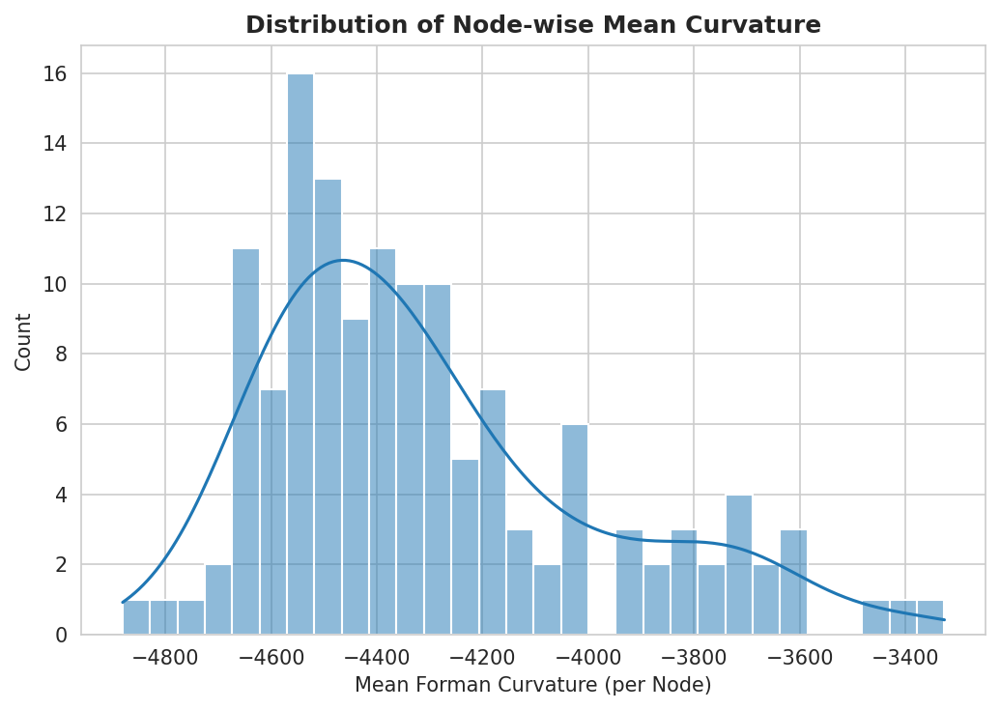

In [56]:
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = (7, 5) # Adjusted size for a single plot

# Create a figure
fig, ax = plt.subplots()

# --- Plot Node-wise Mean Curvature ---
if 'mean_forman_curvature' in adata.obs.columns:
    node_curvatures = adata.obs['mean_forman_curvature']
    sns.histplot(node_curvatures, kde=True, ax=ax, bins=30)
    ax.set_title('Distribution of Node-wise Mean Curvature', fontweight='bold')
    ax.set_xlabel('Mean Forman Curvature (per Node)')
    ax.set_ylabel('Count')
else:
    ax.text(0.5, 0.5, 'adata.obs["mean_forman_curvature"]\nnot found.', 
            ha='center', va='center', color='red')
    ax.set_title('Node-wise Curvature')
    print('Error: Column "mean_forman_curvature" not found in adata.obs')

plt.tight_layout()
plt.show()

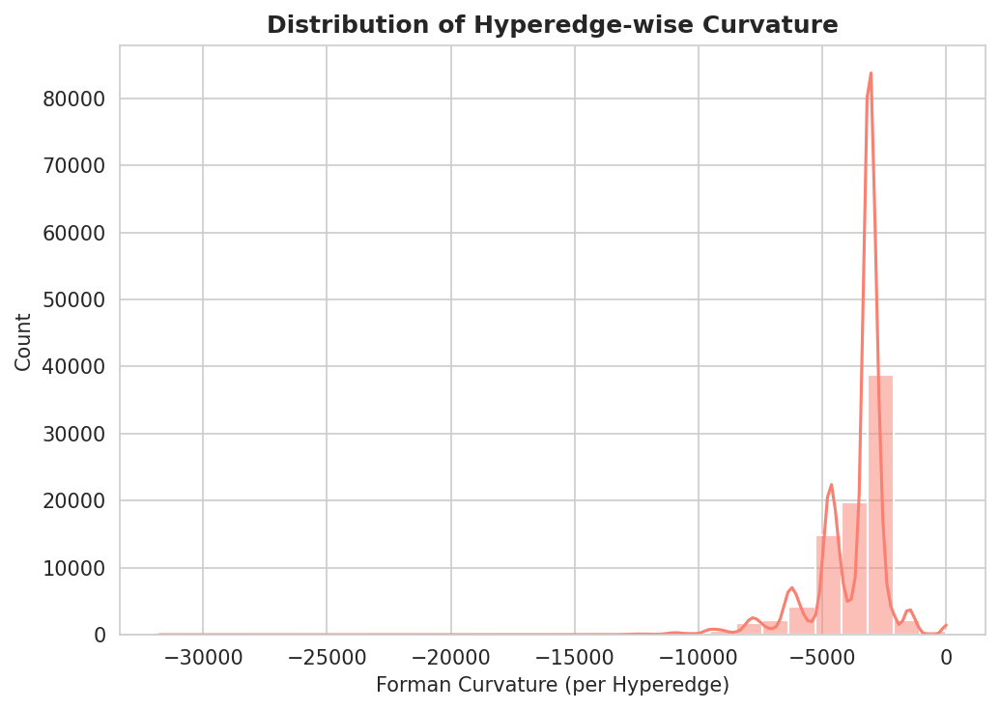

In [57]:
# Set plot style
sns.set_style("whitegrid")
plt.rcParams['figure.dpi'] = 150
plt.rcParams['figure.figsize'] = (7, 5) # Adjusted size for a single plot

# Create a figure
fig, ax = plt.subplots()

# --- Plot Hyperedge-wise Curvature ---
if 'forman_curvature' in adata.var.columns:
    # Drop NaN values for plotting
    edge_curvatures = adata.var['forman_curvature'].dropna()
    sns.histplot(edge_curvatures, kde=True, ax=ax, bins=30, color='salmon')
    ax.set_title('Distribution of Hyperedge-wise Curvature', fontweight='bold')
    ax.set_xlabel('Forman Curvature (per Hyperedge)')
    ax.set_ylabel('Count')
        
    # Check if data is sparse, which might warrant a log scale
    if (edge_curvatures.min() > 0 and 
        edge_curvatures.max() / edge_curvatures.min() > 1000):
        print("Note: Hyperedge curvature spans several orders of magnitude. "
              "Consider using a log scale for the y-axis (ax.set_yscale('log')).")
            
else:
    ax.text(0.5, 0.5, 'adata.var["forman_curvature"]\nnot found.', 
            ha='center', va='center', color='red')
    ax.set_title('Hyperedge-wise Curvature')
    print('Error: Column "forman_curvature" not found in adata.var')

plt.tight_layout()
plt.show()